In [1]:
from sklearn import datasets
from sklearn.linear_model import LogisticRegression
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    balanced_accuracy_score,
    precision_score,
    recall_score,
    confusion_matrix,
)
import optuna
import neptune.new as neptune
import neptune.new.integrations.optuna as optuna_utils
from neptune.new.types import File

In [2]:
def plot_confusion_matrix(cm):
    fig = plt.figure(figsize=(9, 9)) ## change-1
    plt.imshow(cm, interpolation="nearest", cmap="Pastel1")
    plt.title("Confusion matrix", size=15)
    plt.colorbar()
    tick_marks = np.arange(10)
    plt.xticks(
        tick_marks,
        ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"],
        rotation=45,
        size=10,
    )
    plt.yticks(tick_marks, ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"], size=10)
    plt.tight_layout()
    plt.ylabel("Actual label", size=15)
    plt.xlabel("Predicted label", size=15)
    width, height = cm.shape
    for x in range(width):
        for y in range(height):
            plt.annotate(
                str(cm[x][y]),
                xy=(y, x),
                horizontalalignment="center",
                verticalalignment="center",
            )
    # change-2
    run["confusion_matrix.img"].upload(fig)


def get_hyper_params_from_optuna(trial):
    penality = trial.suggest_categorical("penality", ["l1", "l2", "elasticnet", "none"])

    if penality == "none":
        solver_choices = ["newton-cg", "lbfgs", "sag", "saga"]
    elif penality == "l1":
        solver = "liblinear"
    elif penality == "l2":
        solver_choices = ["newton-cg", "lbfgs", "liblinear", "sag", "saga"]
    elif penality == "elasticnet":
        solver = "saga"

    if not (penality == "l1" or penality == "elasticnet"):
        solver = trial.suggest_categorical("solver_" + penality, solver_choices)

    C = trial.suggest_float("inverse_of_regularization_strength", 0.1, 1)

    fit_intercept = trial.suggest_categorical("fit_intercept", [True, False])

    intercept_scaling = trial.suggest_float("intercept_scaling", 0.1, 1.0)

    if penality == "elasticnet":
        l1_ratio = trial.suggest_float("l1_ratio", 0, 1)
    else:
        l1_ratio = None
    return penality, solver, C, fit_intercept, intercept_scaling, l1_ratio


def sanity_checks(digits):
    # change-3
    run["image_data_shape"] = digits.data.shape
    run["label_data_shape"] = digits.target.shape
    
    # change-4
    fig = plt.figure(figsize=(20, 4))

    for index, (image, label) in enumerate(zip(digits.data[0:5], digits.target[0:5])):
        plt.subplot(1, 5, index + 1)
        plt.imshow(np.reshape(image, (8, 8)), cmap=plt.cm.gray)
        plt.title("Training: %i\n" % label, fontsize=20)
    # change-5 
    run["sanity_check-img"].upload(fig)


def visualize_test(x_test, y_test, predictions):
    for image, label, prediction in zip(x_test, y_test, predictions):
        # change-6
        fig = plt.figure(figsize=(8, 8))
        plt.imshow(np.reshape(image, (8, 8)), cmap=plt.cm.gray)
        plt.title(f"Label: {label}, Prediction {prediction}")
        plt.show()
        # change-7
        run["visualization_test-img"].log(fig)


def evaluate_model(logisticRegr, x_test, y_test, predictions):
    score = logisticRegr.score(x_test, y_test)
    balanced_accuracy = balanced_accuracy_score(y_test, predictions)
    precesion = precision_score(y_test, predictions, average=None)
    recall = recall_score(y_test, predictions, average=None)

    # change-8
    run['metrics/mean_acc'] = score
    run['metrics/balanced_acc'] = balanced_accuracy
    run['metrics/precesion'] = precesion
    run['metrics/recall'] = recall
    return score, balanced_accuracy, precesion, recall


def show_confusion_matrix(y_test, predictions):
    cm = confusion_matrix(y_test, predictions)
    # change-9
    run["confusion_matrix"] = cm
    plot_confusion_matrix(cm)


def objective(trial):

    digits = datasets.load_digits()

    sanity_checks(digits)

    x_train, x_test, y_train, y_test = train_test_split(
        digits.data, digits.target, test_size=0.25, random_state=0
    )

    (
        penality,
        solver,
        C,
        fit_intercept,
        intercept_scaling,
        l1_ratio,
    ) = get_hyper_params_from_optuna(trial)

    logisticRegr = LogisticRegression(
        penalty=penality,
        C=C,
        fit_intercept=fit_intercept,
        intercept_scaling=intercept_scaling,
        solver=solver,
        l1_ratio=l1_ratio,
    )
    logisticRegr.fit(x_train, y_train)
    predictions = logisticRegr.predict(x_test)

    visualize_test(x_test, y_test, predictions)

    _, balanced_accuracy, _, _ = evaluate_model(
        logisticRegr, x_test, y_test, predictions
    )

    show_confusion_matrix(y_test, predictions)

    return balanced_accuracy



In [15]:
run = neptune.init(
    project="ananthanandanan/eusMlopstask",
) 


https://app.neptune.ai/ananthanandanan/eusMlopstask/e/EUS-6
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api-reference/run#.stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


[I 2022-06-04 12:13:23,701] A new study created in memory with name: no-name-5e98cb6d-7145-4a97-afc6-98b19cd8f912
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


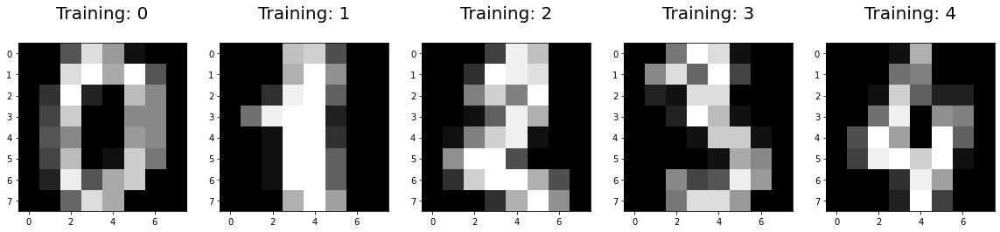

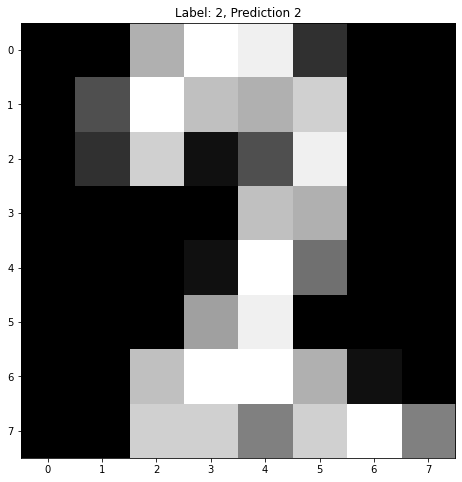

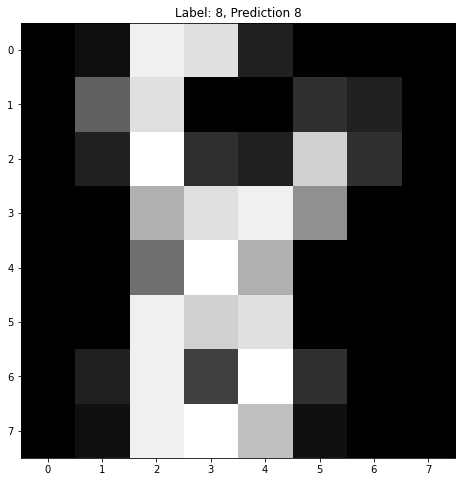

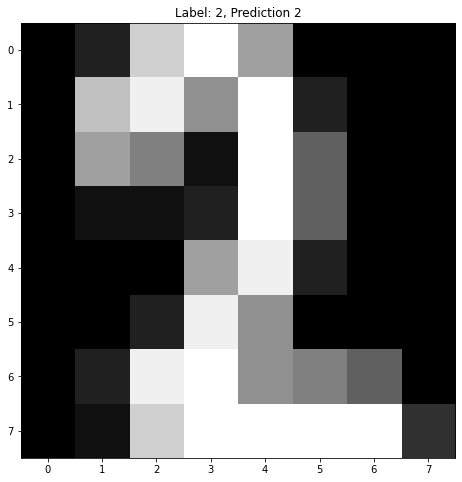

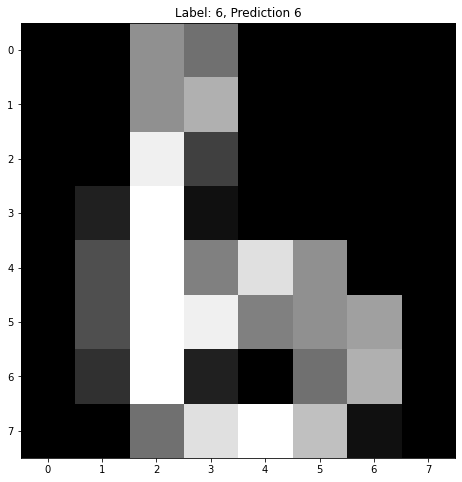

...

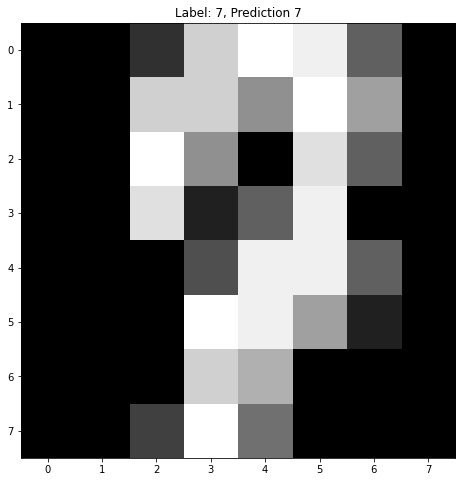

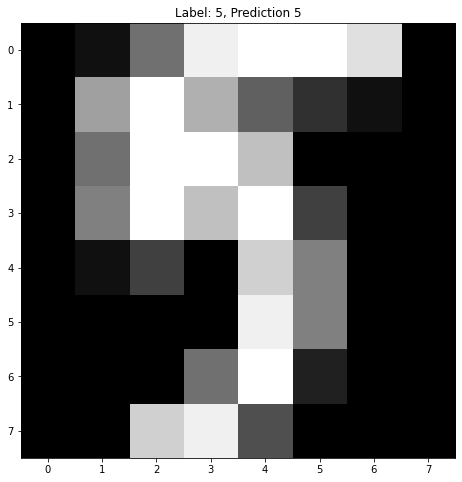

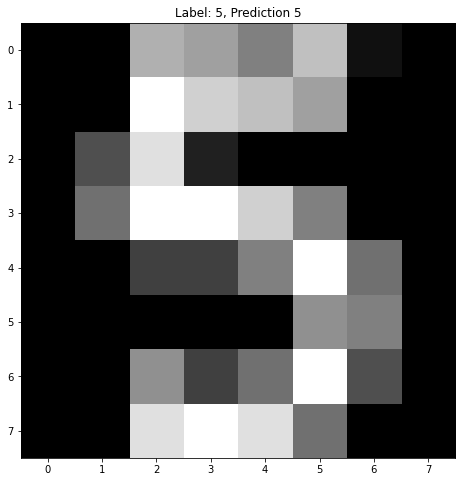

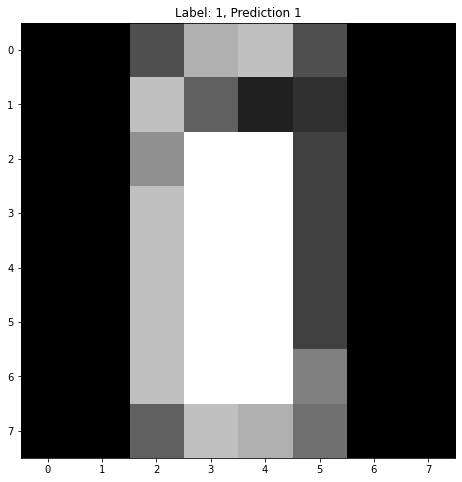

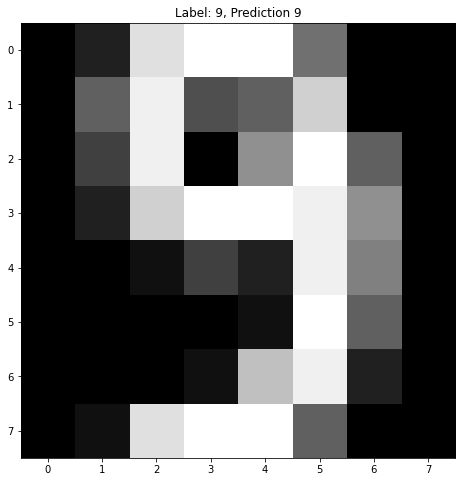

[I 2022-06-04 12:15:15,511] Trial 0 finished with value: 0.9484519561888438 and parameters: {'penality': 'none', 'solver_none': 'lbfgs', 'inverse_of_regularization_strength': 0.21404592579093573, 'fit_intercept': False, 'intercept_scaling': 0.6561731066322459}. Best is trial 0 with value: 0.9484519561888438.
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


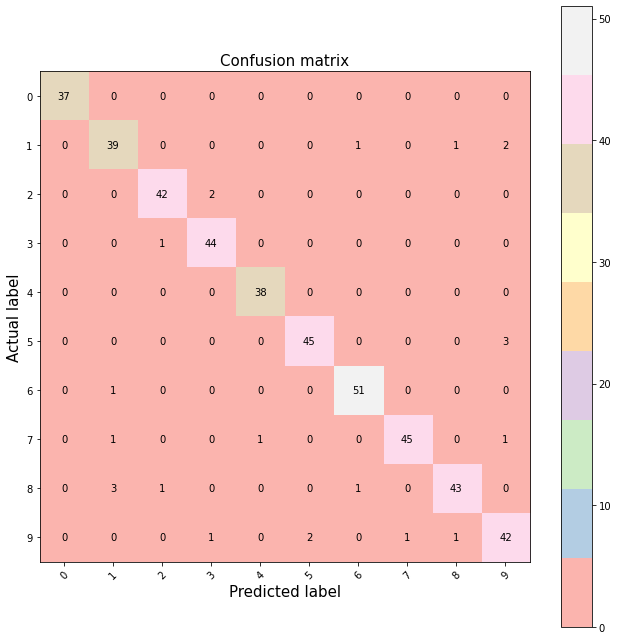

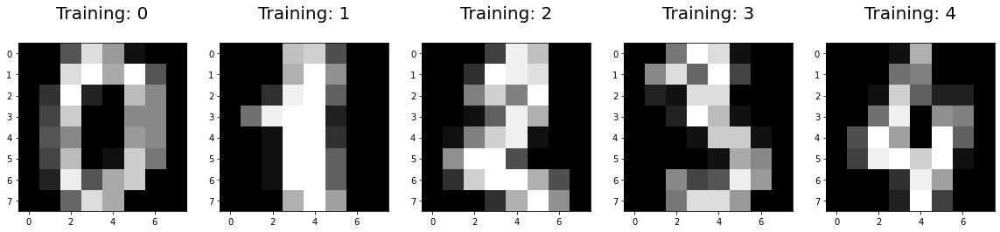

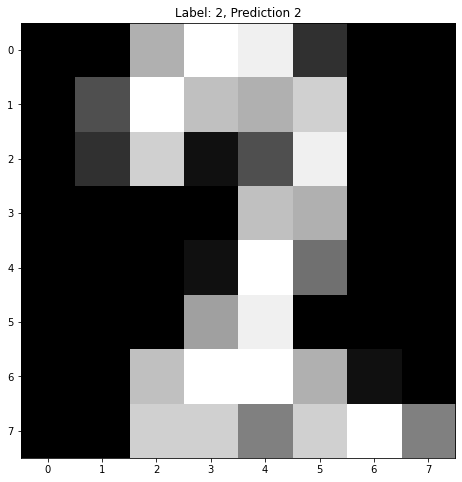

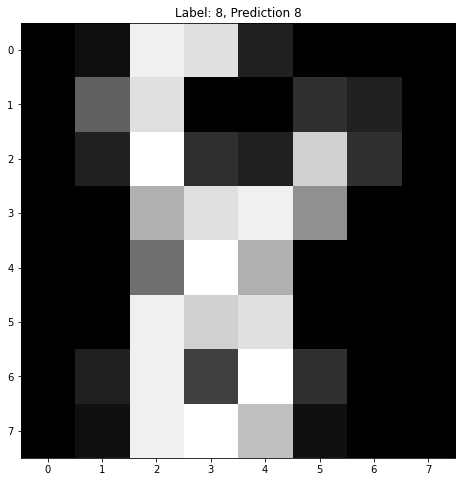

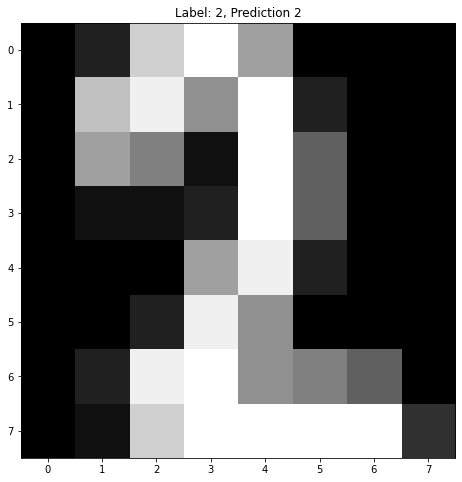

...

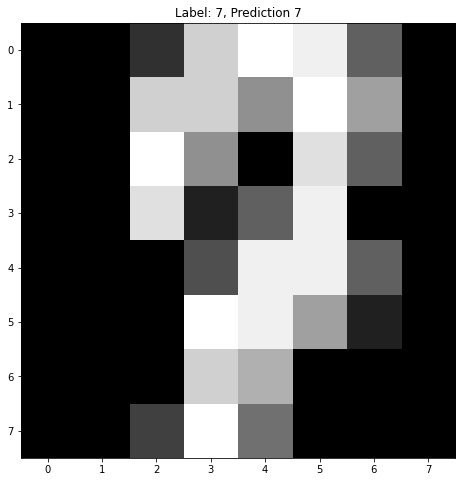

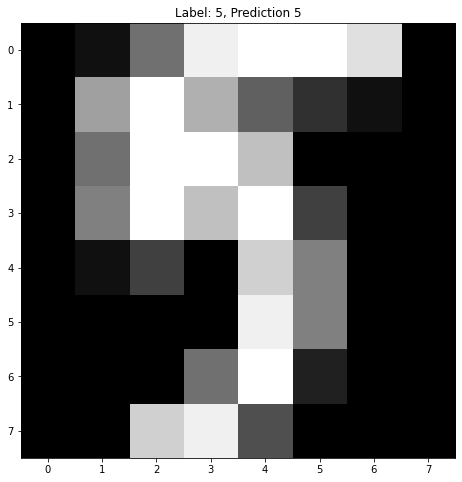

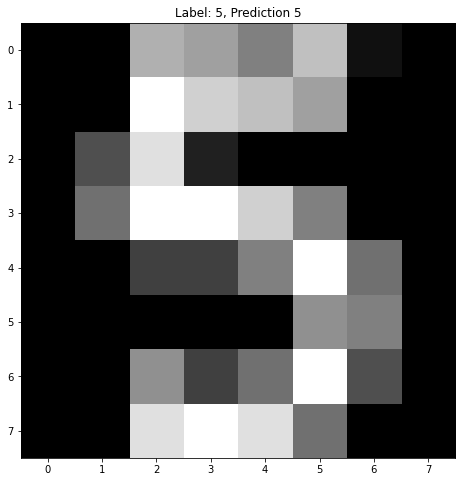

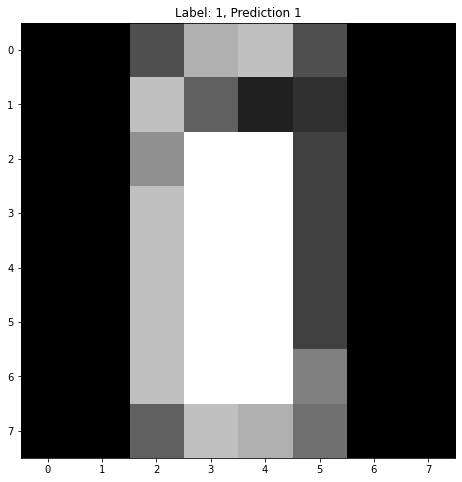

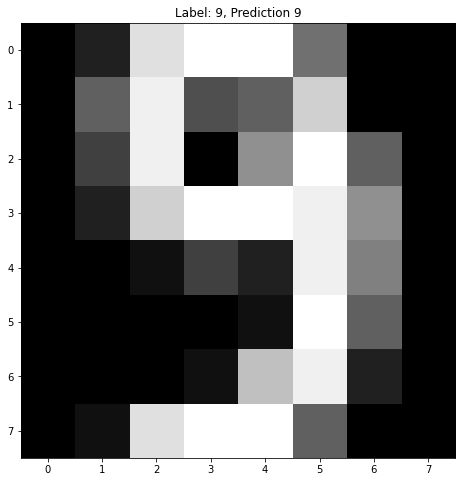

[I 2022-06-04 12:17:07,728] Trial 1 finished with value: 0.9608294424107336 and parameters: {'penality': 'elasticnet', 'inverse_of_regularization_strength': 0.6093435312108462, 'fit_intercept': True, 'intercept_scaling': 0.2609700960011745, 'l1_ratio': 0.7653634512793493}. Best is trial 1 with value: 0.9608294424107336.
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


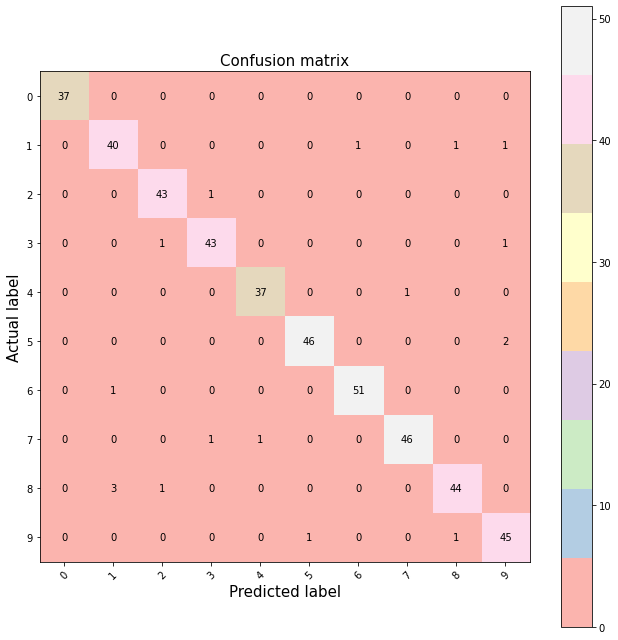

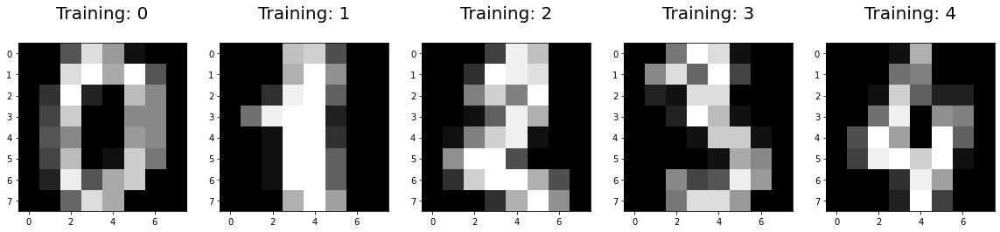

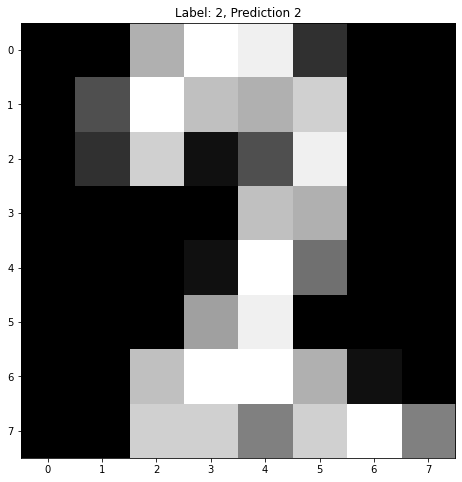

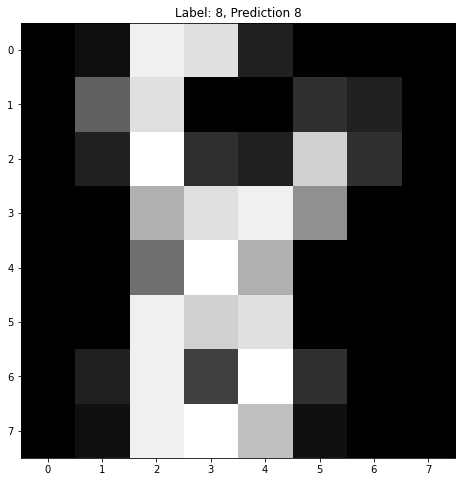

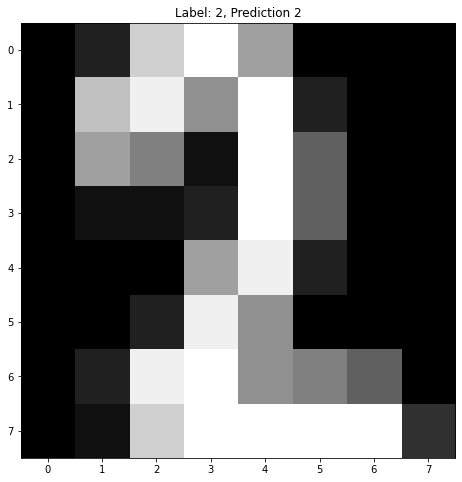

...

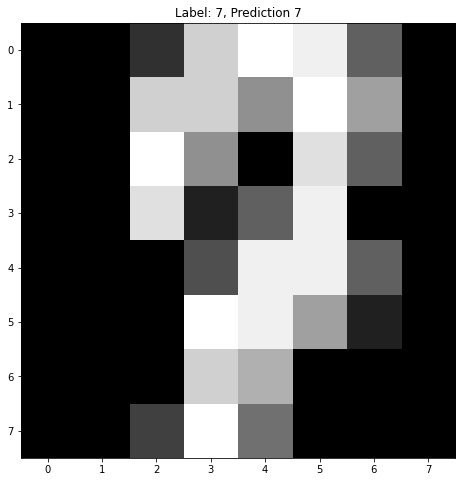

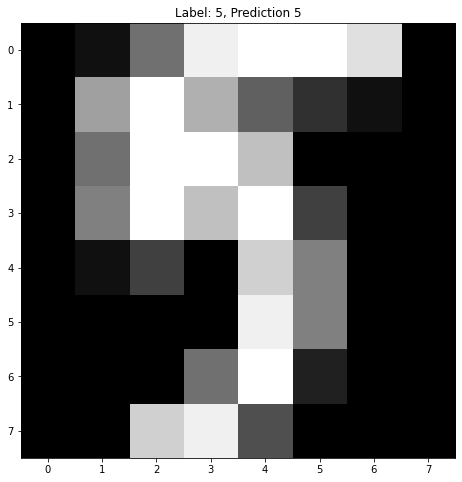

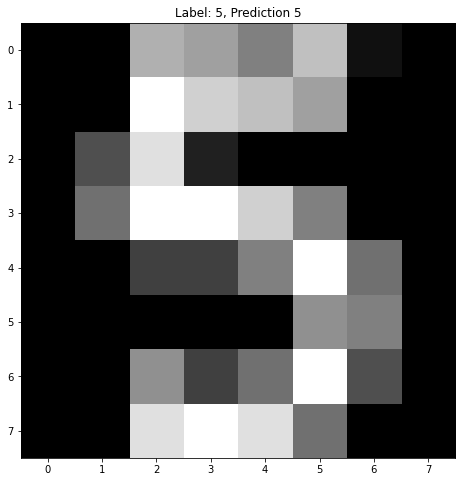

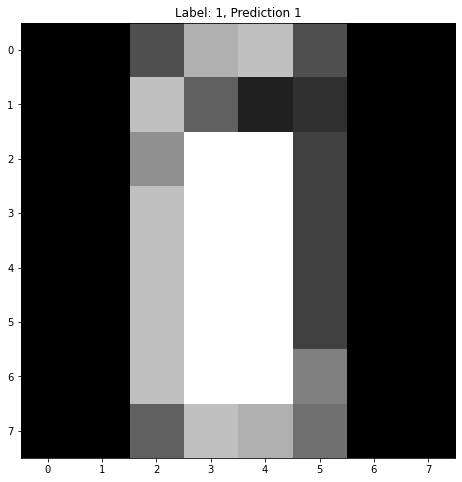

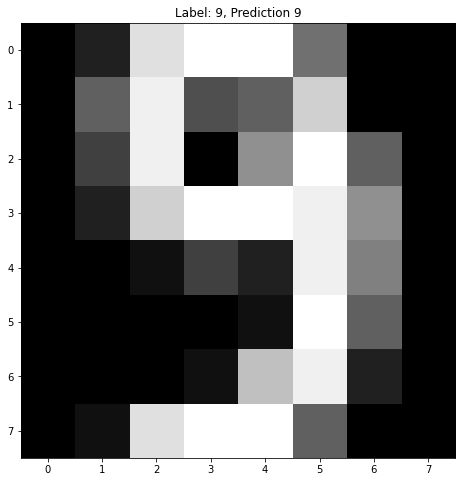

[I 2022-06-04 12:19:02,258] Trial 2 finished with value: 0.9608294424107336 and parameters: {'penality': 'elasticnet', 'inverse_of_regularization_strength': 0.3212175204177635, 'fit_intercept': False, 'intercept_scaling': 0.9307876772697088, 'l1_ratio': 0.3500763595913602}. Best is trial 1 with value: 0.9608294424107336.
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


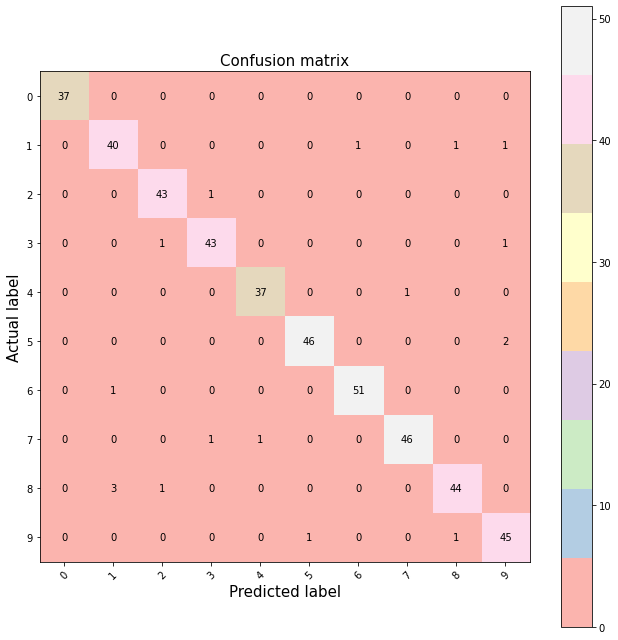

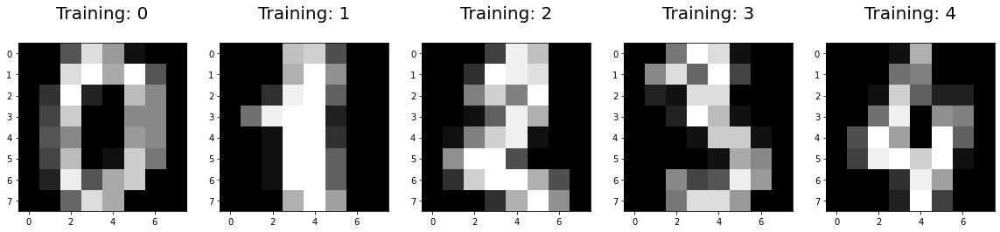

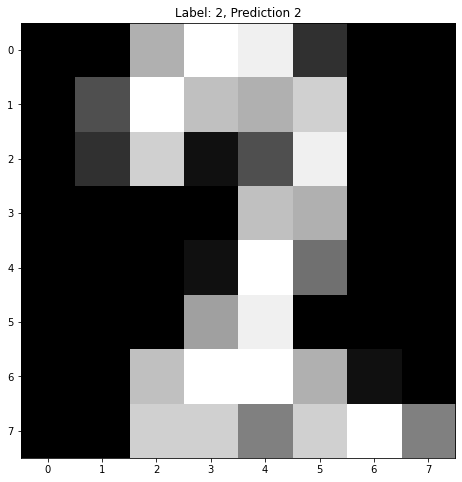

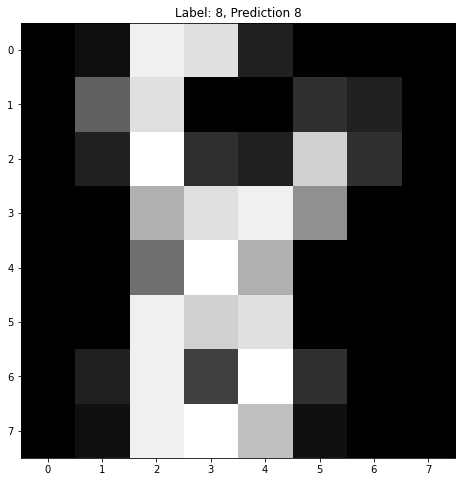

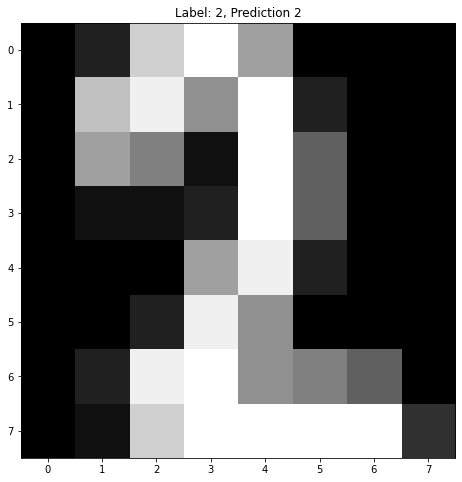

...

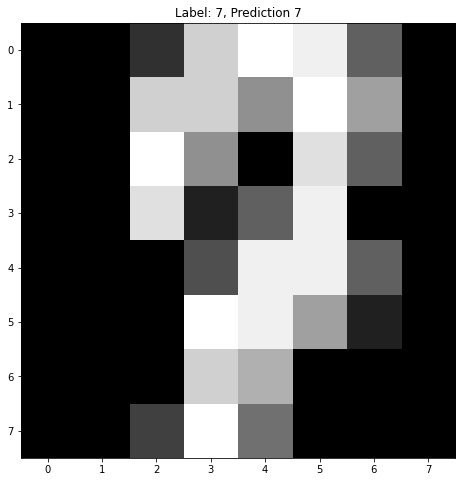

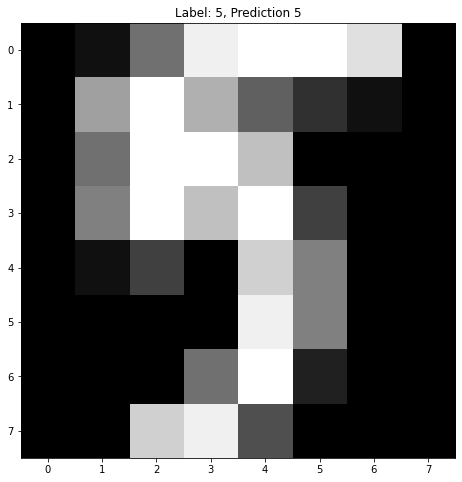

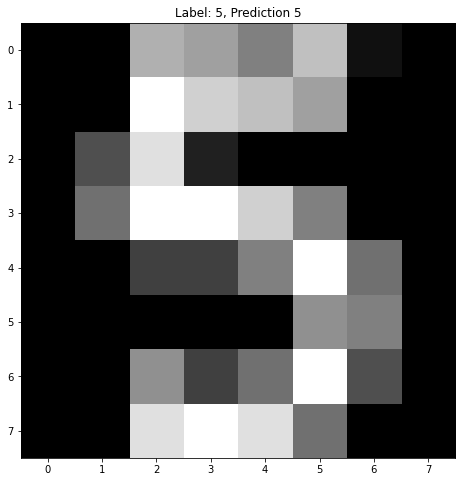

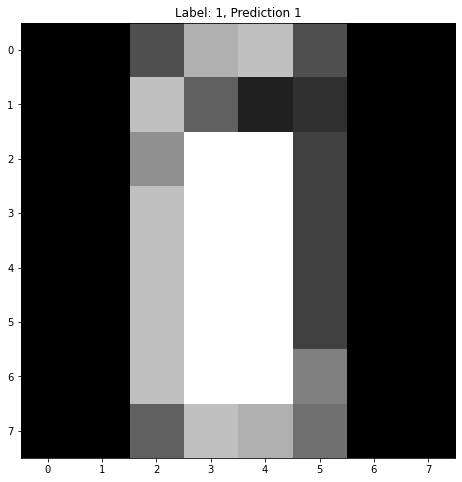

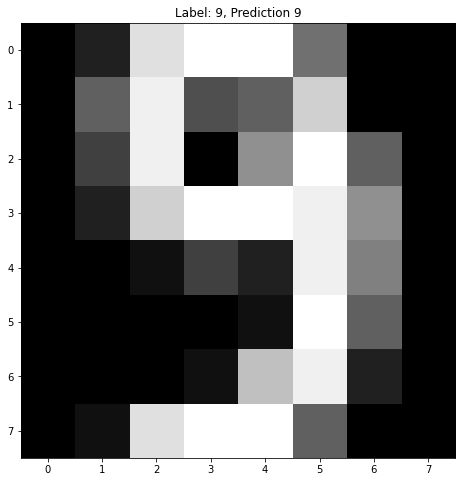

[I 2022-06-04 12:20:57,001] Trial 3 finished with value: 0.9484519561888438 and parameters: {'penality': 'none', 'solver_none': 'lbfgs', 'inverse_of_regularization_strength': 0.5772690968684862, 'fit_intercept': True, 'intercept_scaling': 0.9185336880859117}. Best is trial 1 with value: 0.9608294424107336.
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:1113: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


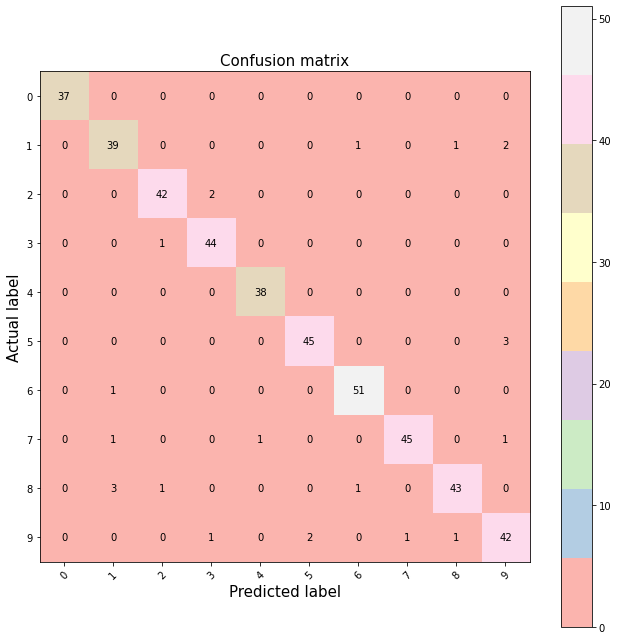

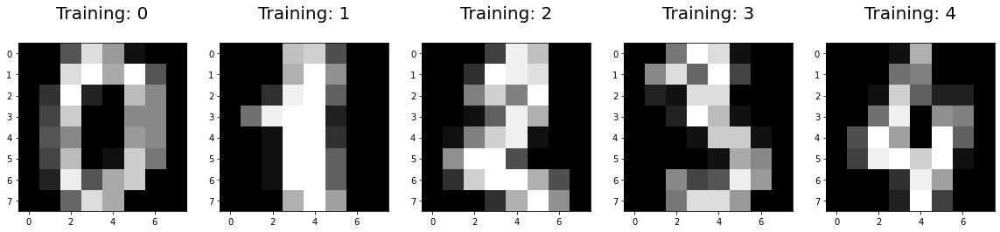

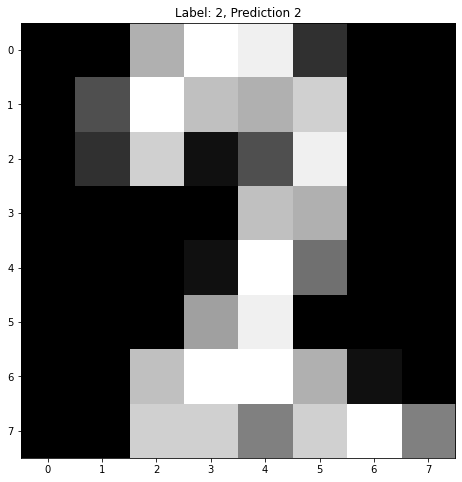

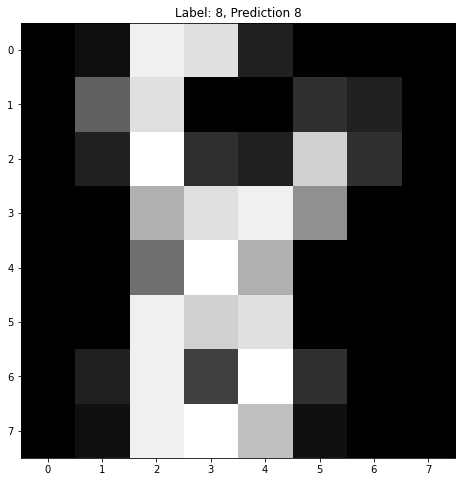

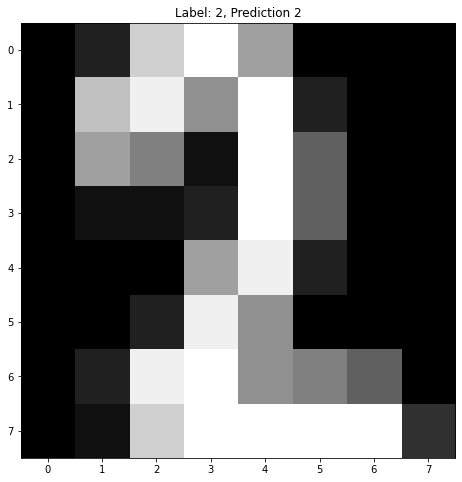

...

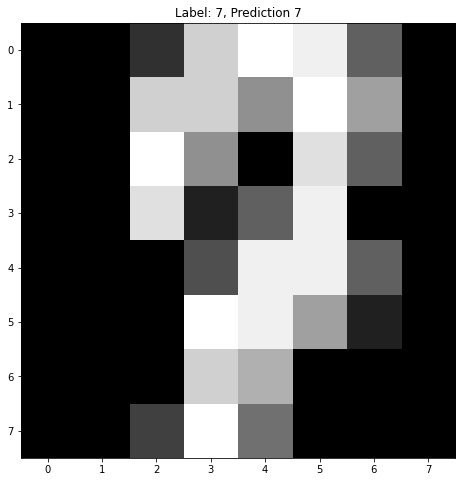

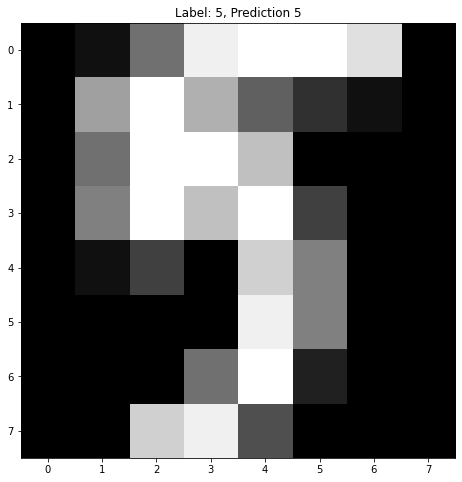

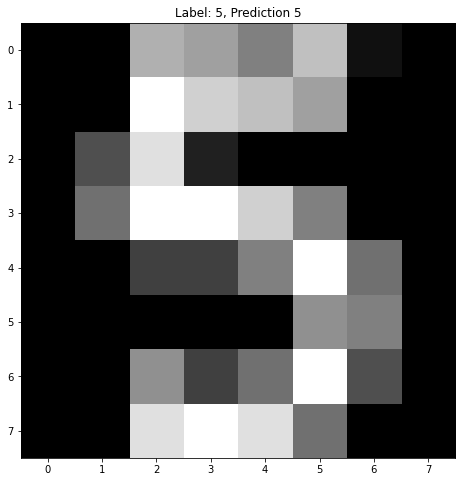

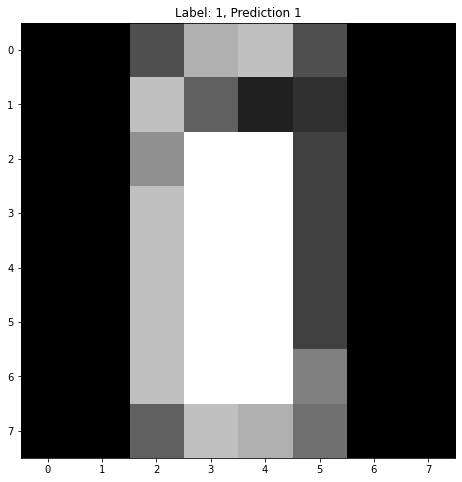

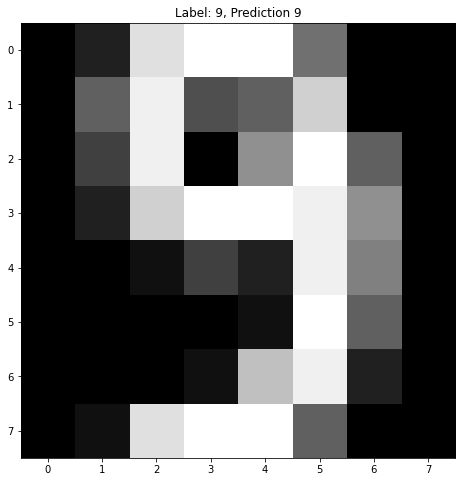

[I 2022-06-04 12:22:50,179] Trial 4 finished with value: 0.9427683018901865 and parameters: {'penality': 'none', 'solver_none': 'newton-cg', 'inverse_of_regularization_strength': 0.3901587867635854, 'fit_intercept': True, 'intercept_scaling': 0.8239234516118329}. Best is trial 1 with value: 0.9608294424107336.


Balanced Accuracy: 0.9608294424107336
Best hyperparameters: {'penality': 'elasticnet', 'inverse_of_regularization_strength': 0.6093435312108462, 'fit_intercept': True, 'intercept_scaling': 0.2609700960011745, 'l1_ratio': 0.7653634512793493}


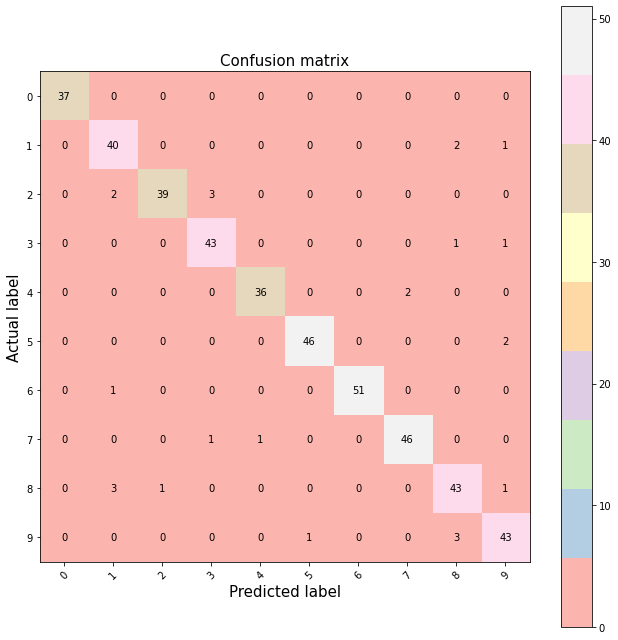

In [16]:
def main():
    # logging optuna trials to neptune through callback
    neptune_callback = optuna_utils.NeptuneCallback(run,
                                                log_plot_contour=False,
                                                log_plot_edf=False,
                                                log_plot_pareto_front=False,
                                                log_plot_intermediate_values=False,
                                                log_plot_slice=False,
                                                log_plot_optimization_history=False,
                                                log_plot_parallel_coordinate=False,
                                                log_plot_param_importances=False)

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=5, callbacks=[neptune_callback])

    trial = study.best_trial

    print("Balanced Accuracy: {}".format(trial.value))
    print("Best hyperparameters: {}".format(trial.params))
    


main()

In [17]:
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
All 1 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/ananthanandanan/eusMlopstask/e/EUS-6
